![](https://lh3.googleusercontent.com/proxy/-bBTsJL_tw26ubVWuYeh0YoyJ8oanM-n1XqT0pZzFgVusQIj9oFR8Mravftp5-UNr9_yIueFbtn_U29uQR0Z5C9eh1ISm6SUSfsEI0x4sLb73hHSdfuD_FY3)raileurope.fr

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import unicodedata
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
plt.style.use('fivethirtyeight')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [4]:
df=pd.read_csv("train_stations_europe.csv")
df.head()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport,entur_id,entur_is_enabled
0,1,Château-Arnoux—St-Auban,Chateau-Arnoux-St-Auban,NaN,44.081790,6.001625,NaN,FR,Europe/Paris,True,False,False,NaN,False
1,2,Château-Arnoux—St-Auban,Chateau-Arnoux-St-Auban,8775123.0,44.061565,5.997373,1.0,FR,Europe/Paris,False,True,False,NaN,False
2,3,Château-Arnoux Mairie,Chateau-Arnoux Mairie,8775122.0,44.063863,6.011248,1.0,FR,Europe/Paris,False,False,False,NaN,False
3,4,Digne-les-Bains,Digne-les-Bains,NaN,44.350000,6.350000,NaN,FR,Europe/Paris,True,False,False,NaN,False
4,6,Digne-les-Bains,Digne-les-Bains,8775149.0,44.088710,6.222982,4.0,FR,Europe/Paris,False,True,False,NaN,False


In [5]:
#Code by Md Redwan Karim Sony https://www.kaggle.com/redwankarimsony/space-missions-data-eda-temporal-analysis

# Calculating
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column': df.columns,
                                 'percent': percent_missing})
missing_value_df.sort_values('percent', inplace=True)
missing_value_df.reset_index(drop=True, inplace=True)
missing_value_df = missing_value_df[missing_value_df['percent']>0]

# Plotting
fig = px.bar(
    missing_value_df, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Columns with Missing Values', 
    height=200, 
    width=600
)
fig.show()

#Codes by Taikutsu https://www.kaggle.com/ravels1991/simple-eda/comments

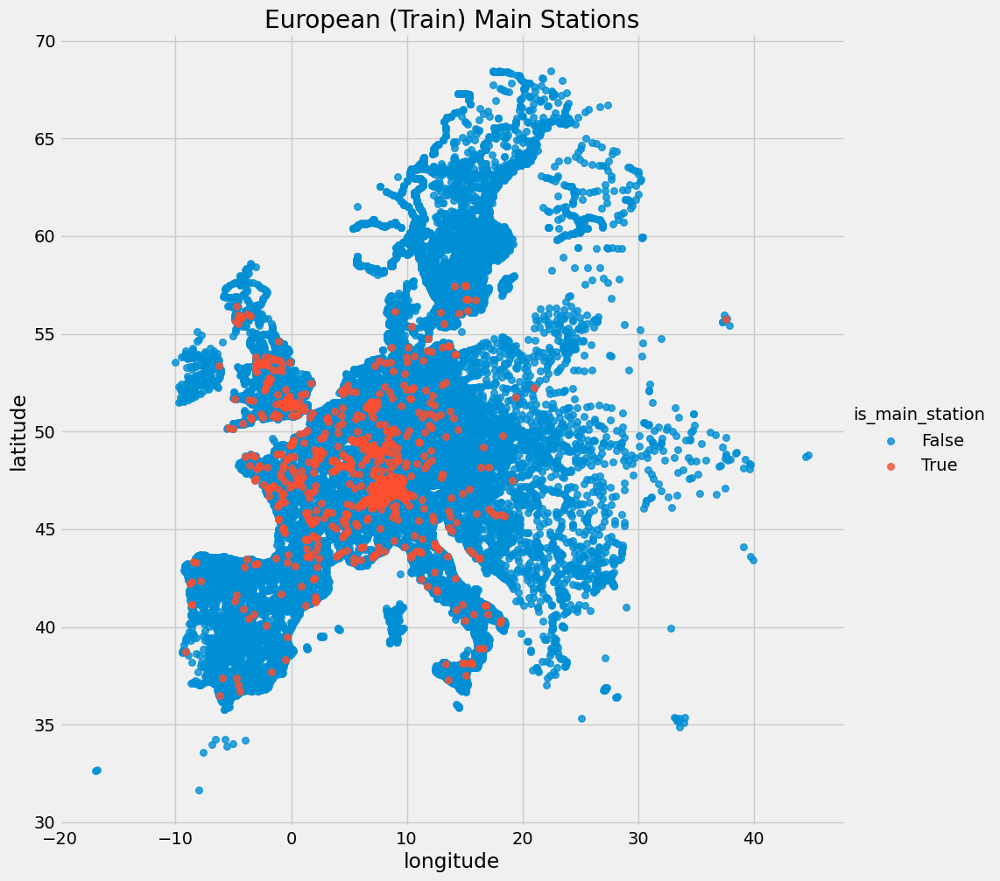

In [6]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_main_station', height=10)
plt.title('European (Train) Main Stations')
plt.show()

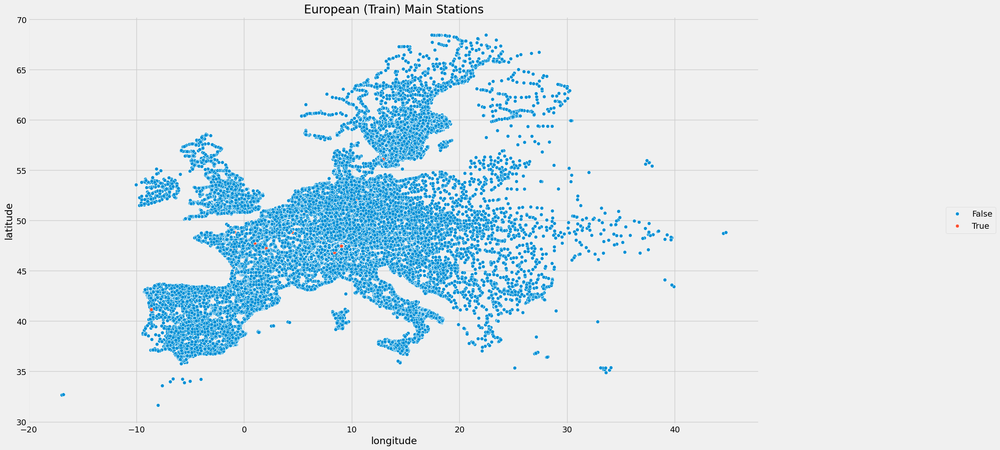

In [7]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_main_station')
plt.title('European (Train) Main Stations')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

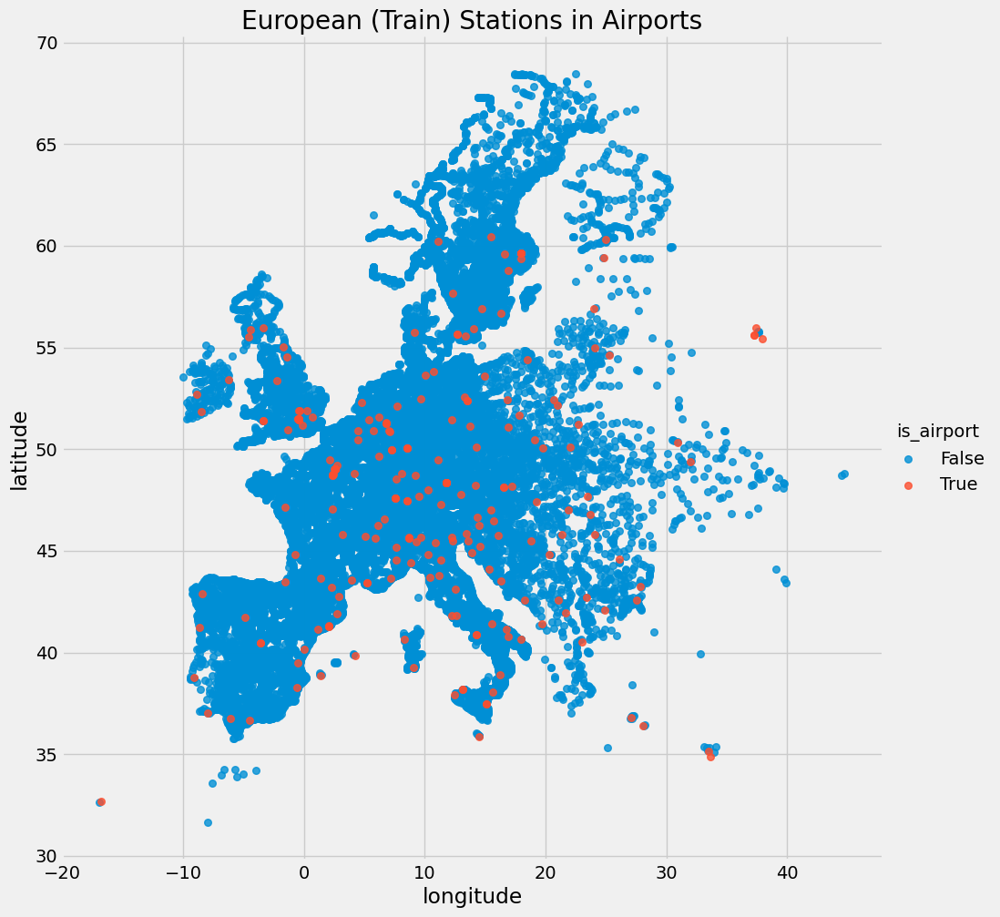

In [8]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_airport', height=10)
plt.title('European (Train) Stations in Airports')
plt.show()

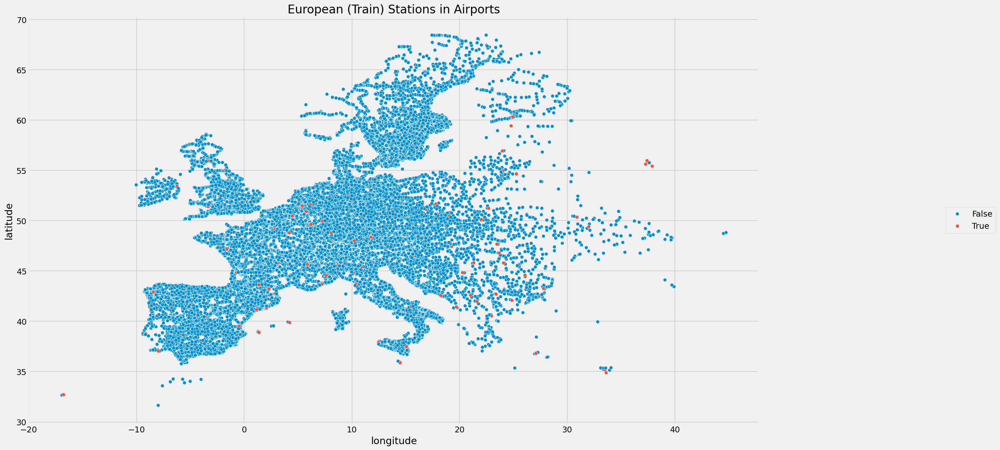

In [9]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_airport')
plt.title('European (Train) Stations in Airports')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

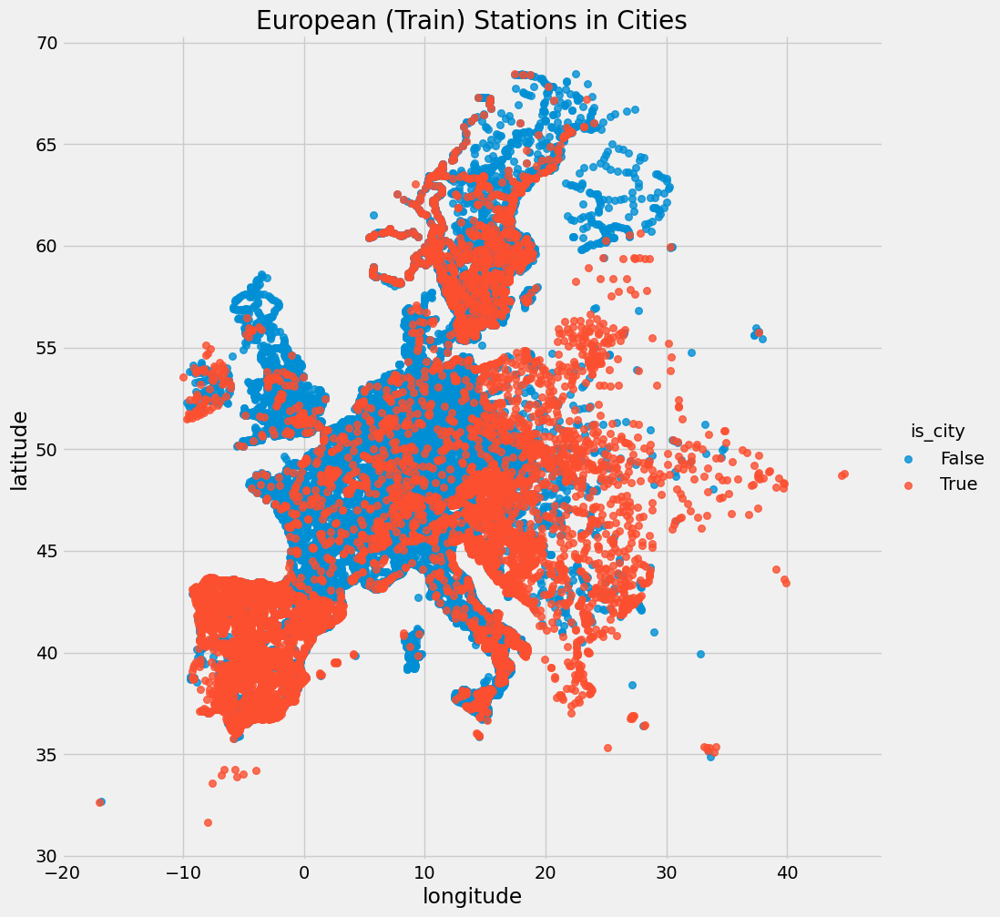

In [10]:
g = sns.lmplot(x="longitude", y="latitude", data=df,
           fit_reg=False, scatter_kws={"s": 30}, hue='is_city', height=10)
plt.title('European (Train) Stations in Cities')
plt.show()

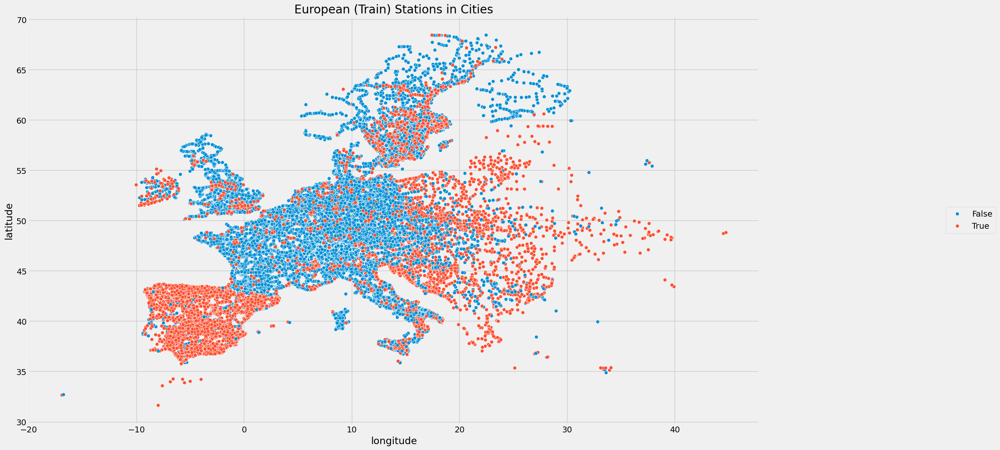

In [11]:
plt.figure(figsize=(20,12))
g = sns.scatterplot(x='longitude', y='latitude', data=df, hue='is_city')
plt.title('European (Train) Stations in Cities')
g.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1);

In [12]:
pillgram = df[(df['name']=='Pillgram Schulstraße')].reset_index(drop=True)
pillgram.tail()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport,entur_id,entur_is_enabled
0,39221,Pillgram Schulstraße,Pillgram Schulstrasse,NaN,52.330505,14.394534,NaN,DE,Europe/Berlin,False,False,False,NaN,False


#Codes from Iván Hernández Cazorla https://www.kaggle.com/ivanhercaz/museums-in-tenerife-location-map

In [13]:
#Codes from Iván Hernández Cazorla https://www.kaggle.com/ivanhercaz/museums-in-tenerife-location-map

fig_px = px.scatter_mapbox(pillgram, lat="latitude", lon="longitude",
                           hover_name="name_norm",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})


fig_px.show()

C:\Users\Mike\AppData\Local\Temp\ipykernel_10148\3136561099.py:3: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [14]:
nimes = df[(df['name']=='Nîmes Pont du Gard')].reset_index(drop=True)
nimes.tail()

,id,name,name_norm,uic,latitude,longitude,parent_station_id,country,time_zone,is_city,is_main_station,is_airport,entur_id,entur_is_enabled
0,38108,Nîmes Pont du Gard,Nimes Pont du Gard,8770397.0,43.816944,4.507778,22600.0,FR,Europe/Paris,False,False,False,NaN,False


In [15]:
fig_px = px.scatter_mapbox(nimes, lat="latitude", lon="longitude",
                           hover_name="name_norm",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

C:\Users\Mike\AppData\Local\Temp\ipykernel_10148\2291826718.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [16]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="name",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

C:\Users\Mike\AppData\Local\Temp\ipykernel_10148\918360457.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [17]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="country",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

C:\Users\Mike\AppData\Local\Temp\ipykernel_10148\2132280763.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [18]:
fig_px = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           hover_name="is_airport",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

C:\Users\Mike\AppData\Local\Temp\ipykernel_10148\3053202054.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [19]:
#Code by Olga Belitskaya https://www.kaggle.com/olgabelitskaya/sequential-data/comments
from IPython.display import display,HTML
c1,c2,f1,f2,fs1,fs2=\
'#eb3434','#eb3446','Akronim','Smokum',30,15
def dhtml(string,fontcolor=c1,font=f1,fontsize=fs1):
    display(HTML("""<style>
    @import 'https://fonts.googleapis.com/css?family="""\
    +font+"""&effect=3d-float';</style>
    <h1 class='font-effect-3d-float' style='font-family:"""+\
    font+"""; color:"""+fontcolor+"""; font-size:"""+\
    str(fontsize)+"""px;'>%s</h1>"""%string))
    
    
dhtml('Marília Prata, @mpwolke Was here' )